<h1><center><span style="color:red">Installs and Imports</span></center></h1>

In [1]:
#!pip uninstall sklearn
#!pip uninstall scikit-learn
#!pip install -U numpy
#!pip install numpy
#!pip install -U pandas
#!pip install pandas
#!pip install -U scipy
#!pip install scipy
#!pip install -U scikit-learn
#!pip install scikit-learn
#!pip install sklearn
#!pip install -U imbalanced-learn
#!pip install imbalanced-learn
#!pip install -U wget
#!pip install wget
#!pip install -U geopy
#!pip install geopy
#!pip install -U folium
#!pip install folium
#!pip install folium==0.5.0
#!pip install xlrd
#!pip install -U xlrd
#!pip install openpyxl
#!pip install -U openpyxl
#!pip install geocoder
#!pip install geopandas
print('...INSTALLS DONE')

...INSTALLS DONE


In [2]:
import numpy as np                                   # library to handle data in a vectorized manner
import pandas as pd                                  # library for data analsysis
from pandas import json_normalize                    # module to tranform JSON file into a pandas dataframe
import json                                          # library to handle JSON files
import requests                                      # library to handle requests such as when webscraping
# import sklearn                                       # library for predictive data analysis
# from sklearn.model_selection import train_test_split # module for splitting data for test and train
# from sklearn.cluster import KMeans                   # module for KMeans Clustering
# from sklearn import svm                              # module for Support Vector Machines Classification
# from sklearn.neighbors import KNeighborsClassifier   # module for K Nearest Neighbor Classification
# from sklearn.linear_model import LogisticRegression  # module for Logistic Regression Classification
# from sklearn.tree import DecisionTreeClassifier      # module for Decision Tree Classification
# from sklearn import tree                             # module for visualizing Decision Trees
# from sklearn import preprocessing                    # module for standardizes data for downstream estimators
# from sklearn import metrics                          # module for computes subset accuracy
# from sklearn.metrics import confusion_matrix         # module for Confusion Matrix display
# from sklearn.metrics import jaccard_score            # module for Jaccard scoring
# from sklearn.metrics import classification_report    # module for Classification Report
# from sklearn.metrics import log_loss                 # module for Log Loss scoring
# from sklearn.metrics import f1_score                 # module for F1 scoring
import matplotlib.pyplot as plt                      # module for interactive plots
import matplotlib.cm as cm                           # module for colormap handling
import matplotlib.colors as colors                   # module for converting numbers or color arguments to RGB or RGBA
import matplotlib.image as mpimg                     # module for basic image loading, rescaling and display operations
import urllib.request                                # module for pulling in URL data
import wget                                          # module for importing externally hosted files
# import xlrd                                          # library for importing Excel .xls files (but not .xlsx)
# from openpyxl import Workbook                        # module to write to a new Excel file
# from openpyxl import load_workbook                   # module to import Excel files (including .xlsx)
import folium                                        # library for map rendering
from folium import plugins                           # module for folium plugins
from folium.plugins import HeatMap                   # module for folium heatmap
import geopandas                                     # library for mapping
import fiona                                         # dependency of geopandas
import shapely                                       # dependency of geopandas
import pyproj                                        # dependency of geopandas
import rtree                                         # dependency of geopandas
import descartes                                     # dependency of geopandas
# import pylab as pl                                   # pylab is a convenience module that bulk imports matplotlib.pyplot and numpy, no longer recommended
# import scipy.optimize as opt                         # package provides several commonly used optimization algorithms
import itertools                                     # library for creating iterators for efficient looping
from io import StringIO                              # library to create an in-memory file-like object
from bs4 import BeautifulSoup                        # library for webscraping
from geopy.geocoders import Nominatim                # library to find lat/long from address
# from tqdm.notebook import tqdm                       # library for making progress bars
# from time import sleep                               # used by TQDM

# %matplotlib inline                                   # magic function so output of plotting commands is displayed inline
# import pydotplus                                     # library for Python interface to Graphviz's Dot language
# from pandas.io.json import json_normalize            # deprecated version of tranform JSON file into a pandas dataframe

print('...LIBRARIES IMPORTED')

...LIBRARIES IMPORTED


In [3]:
# disable false "chained assignment" warnings
pd.options.mode.chained_assignment = None  # default='warn'

<h1><center><span style="color:red">Setting Basic Variables</span></center></h1>

In [4]:
# @hidden_cell
# text above will make this cell hidden when shared from Watson Studio to GitHub

my_id = '5DITIKJB0DXN5D02SRH5XC4EXDO4Z2FXOAJKOQ5CHZCP2BSK'
my_secret = 'XENP21VW2CSAV3BGXGFMQNNMETLDTAG3YGUUXGQWATWRT5WU'
my_token = 'UVX4G3HQGZXAI0FF45D2KLZDP0PIW4YCUMP2EHKDVAQYEYVE'
census_key = '2fb1cab4bb0dfe86d6f649ad43d92b2b56df22f6'

print('...HIDDEN VARIABLES SET')

...HIDDEN VARIABLES SET


In [5]:
# setting some basic variables

CLIENT_ID = my_id                          # your Foursquare ID
CLIENT_SECRET = my_secret                  # your Foursquare Secret
ACCESS_TOKEN = my_token                    # your Foursquare Access Token
VERSION = '20210401'                       # Foursquare API version
LIMIT = 1000                               # A default Foursquare API limit value
RADIUS = 2000                              # search / explore radius in meters
VENUE_SEARCH = '4af3a181f964a520fcee21e3'  # ID of venue to be searched for
SEARCH_LOC = 'Boston, MA'                  # location key for SEARCH or EXPLORE endpoint (near=)
SEARCH_CAT_ID = '4d4b7105d754a06374d81259' # category key for SEARCH or EXPLORE endpoint (categoryId=)
SECTION = 'food'                           # section key for EXPLORE endpoint (section=)
OFFSET1 = 100                              # offset key for EXPLORE endpoint (offset=)
OFFSET2 = 200                              # offset key for EXPLORE endpoint (offset=)
OFFSET3 = 300                              # offset key for EXPLORE endpoint (offset=)

print('...FOURSQUARE API CREDENTIALS SET')

...FOURSQUARE API CREDENTIALS SET


In [6]:
# geolocator to get basic coordinates
address = 'Boston, MA'
geolocator = Nominatim(user_agent="rsgd_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print("coordinates: latitude",latitude,"/ longitude",longitude)

coordinates: latitude 42.3602534 / longitude -71.0582912


<h1><center><span style="color:red">File Imports</span></center></h1>

In [153]:
# download Mapshaper-derived neighborhood JSON files
datafile_url = ("https://raw.githubusercontent.com/rsgdodge/Coursera_Capstone/master/data")
NeighborhoodJSON = f"{datafile_url}/Mapshaper_GeoJSON_Boston.json"
# NeighborhoodTOPO = f"{datafile_url}/Mapshaper_TopoJSON_output.json"

# N_AllstonJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Allston.json"
# N_Back_BayJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Back_Bay.json"
# N_Beacon_HillJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Beacon_Hill.json"
# N_BrightonJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Brighton.json"
# N_CharlestownJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Charlestown.json"
# N_DorchesterJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Dorchester.json"
# N_DowntownJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Downtown.json"
# N_East_BostonJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_East_Boston.json"
# N_FenwayJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Fenway.json"
# N_Harbor_IslandsJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Harbor_Islands.json"
# N_Hyde_ParkJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Hyde_Park.json"
# N_Jamaica_PlainJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Jamaica_Plain.json"
# N_LMAJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_LMA.json"
# N_MattapanJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Mattapan.json"
# N_Mission_HillJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Mission_Hill.json"
# N_North_EndJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_North_End.json"
# N_RoslindaleJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Roslindale.json"
# N_RoxburyJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Roxbury.json"
# N_South_BostonJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_South_Boston.json"
# N_South_Boston_WaterfrontJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_South_Boston_Waterfront.json"
# N_South_EndJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_South_End.json"
# N_WaterJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_Water.json"
# N_West_EndJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_West_End.json"
# N_West_RoxburyJSON = f"{datafile_url}/Mapshaper_GeoJSON_output_West_Roxbury.json"

# download countries geojson file of Boston Census Tracts
GeoDataJSON=geopandas.read_file('https://opendata.arcgis.com/datasets/4a8eb4fb3be44ed5a1eec28551b9f3b2_0.geojson')

# download github csv files
BPDA_Neighborhoods = pd.read_csv(r'https://raw.githubusercontent.com/rsgdodge/Coursera_Capstone/master/data/BPDA_Neighborhoods.csv')
Broad_Categories = pd.read_csv(r'https://raw.githubusercontent.com/rsgdodge/Coursera_Capstone/master/data/Broad_Categories.csv')

print(".....JSON FILES IMPORTED")

.....JSON FILES IMPORTED


In [8]:
# importing list of neighborhoods
BPDA_Neighborhoods.head()

,GEOID10,NAME10,NAMELSAD10,2014 BPDA Neighborhood
0,25025990101,9901.01,Census Tract 9901.01,(water)
1,25025000703,7.03,Census Tract 7.03,Allston
2,25025000704,7.04,Census Tract 7.04,Allston
3,25025000802,8.02,Census Tract 8.02,Allston
4,25025000803,8.03,Census Tract 8.03,Allston


In [154]:
# importing list of higher level categories
Broad_Categories.head()

,Venue Category,Broad Category,Short Type
0,African Restaurant,African,African
1,Ethiopian Restaurant,African,Ethiopian
2,American Restaurant,American,American
3,BBQ Joint,American,BBQ Joint
4,Burger Joint,American,Burger Joint


In [10]:
GeoDataJSON.head()

,FID,OBJECTID,STATEFP10,COUNTYFP10,TRACTCE10,GEOID10,NAME10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,Shape_STAr,Shape_STLe,Shape__Area,Shape__Length,geometry
0,1,1,25,025,010405,25025010405,104.05,Census Tract 104.05,G5020,S,363702,0,+42.3398654,-071.0896052,3.914568e+06,14629.550361,666099.906250,6036.192858,"POLYGON ((-71.09009 42.34667, -71.09001 42.346..."
1,2,2,25,025,010404,25025010404,104.04,Census Tract 104.04,G5020,S,136829,0,+42.3419667,-071.0886375,1.472714e+06,5277.643216,250612.402344,2176.592125,"POLYGON ((-71.09066 42.33977, -71.09103 42.339..."
2,3,3,25,025,010801,25025010801,108.01,Census Tract 108.01,G5020,S,127905,0,+42.3541193,-071.0770216,1.376667e+06,6166.497167,234357.902344,2542.042976,"POLYGON ((-71.08160 42.35371, -71.08044 42.354..."
3,4,4,25,025,010702,25025010702,107.02,Census Tract 107.02,G5020,S,299981,0,+42.3518354,-071.0755159,3.228780e+06,7818.852369,549614.046875,3224.572988,"POLYGON ((-71.07066 42.35186, -71.07046 42.351..."
4,5,5,25,025,010204,25025010204,102.04,Census Tract 102.04,G5020,S,254706,0,+42.3462887,-071.1033879,2.741497e+06,7621.654206,466585.234375,3143.610963,"POLYGON ((-71.10683 42.34876, -71.10520 42.348..."


<AxesSubplot:>

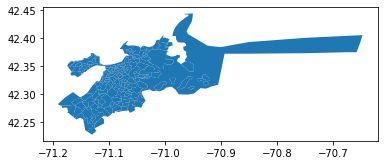

In [11]:
# geopandas "plot()" will plot what's in the GeoJSON itself, not overlaid on a folium map
GeoDataJSON.plot()

<h1><center><span style="color:red">Venue Data Work Begins</span></center></h1>

In [136]:
# adding Neighborhood data to GeoDataJSON. This appears to turn it into a dataframe, we will fix later.
City_Geo = pd.merge(GeoDataJSON, BPDA_Neighborhoods, how='left', on='NAMELSAD10')         # join on key
City_Geo.drop(columns=['GEOID10_y', 'NAME10_y'], inplace=True)                            # drop duplicate columns
City_Geo.rename(columns={"2014 BPDA Neighborhood":"Neighborhood","GEOID10_x":"GEOID10",   # rename columns
                           "NAME10_x":"NAME10"}, inplace=True)                            # rename columns
City_Geo.reset_index(inplace=True, drop=True)
City_Geo.head()

,FID,OBJECTID,STATEFP10,COUNTYFP10,TRACTCE10,GEOID10,NAME10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,Shape_STAr,Shape_STLe,Shape__Area,Shape__Length,geometry,Neighborhood
0,1,1,25,025,010405,25025010405,104.05,Census Tract 104.05,G5020,S,363702,0,+42.3398654,-071.0896052,3.914568e+06,14629.550361,666099.906250,6036.192858,"POLYGON ((-71.09009 42.34667, -71.09001 42.346...",Fenway
1,2,2,25,025,010404,25025010404,104.04,Census Tract 104.04,G5020,S,136829,0,+42.3419667,-071.0886375,1.472714e+06,5277.643216,250612.402344,2176.592125,"POLYGON ((-71.09066 42.33977, -71.09103 42.339...",Fenway
2,3,3,25,025,010801,25025010801,108.01,Census Tract 108.01,G5020,S,127905,0,+42.3541193,-071.0770216,1.376667e+06,6166.497167,234357.902344,2542.042976,"POLYGON ((-71.08160 42.35371, -71.08044 42.354...",Back Bay
3,4,4,25,025,010702,25025010702,107.02,Census Tract 107.02,G5020,S,299981,0,+42.3518354,-071.0755159,3.228780e+06,7818.852369,549614.046875,3224.572988,"POLYGON ((-71.07066 42.35186, -71.07046 42.351...",Back Bay
4,5,5,25,025,010204,25025010204,102.04,Census Tract 102.04,G5020,S,254706,0,+42.3462887,-071.1033879,2.741497e+06,7621.654206,466585.234375,3143.610963,"POLYGON ((-71.10683 42.34876, -71.10520 42.348...",Fenway


In [13]:
# create "getNearbyVenues" function with Lat+Lng from input, remainder from basic variables at top

def getNearbyVenues(names, latitudes, longitudes):
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        # print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&section={}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            SECTION,
            RADIUS, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'],
            v['venue']['id'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name'],
            v['venue']['location']['distance']
            ) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Input Neighborhood', 
                  'Input Latitude', 
                  'Input Longitude', 
                  'Venue', 
                  'Venue_ID',
                  'Venue_Latitude', 
                  'Venue_Longitude', 
                  'Venue_Category',
                  'Venue_Distance']
    
    return(nearby_venues)
print("...'getNearbyVenues' FUNCTION CREATED")

...'getNearbyVenues' FUNCTION CREATED


In [14]:
# create "getNearbyVenues100" function with Lat+Lng from input, remainder from basic variables at top

def getNearbyVenues100(names, latitudes, longitudes):
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        # print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&section={}&radius={}&limit={}&offset=100'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            SECTION,
            RADIUS, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'],
            v['venue']['id'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name'],
            v['venue']['location']['distance']
            ) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Input Neighborhood', 
                  'Input Latitude', 
                  'Input Longitude', 
                  'Venue', 
                  'Venue_ID',
                  'Venue_Latitude', 
                  'Venue_Longitude', 
                  'Venue_Category',
                  'Venue_Distance']
    
    return(nearby_venues)
print("...'getNearbyVenues100' FUNCTION CREATED")

...'getNearbyVenues100' FUNCTION CREATED


In [15]:
# create "getNearbyVenues200" function with Lat+Lng from input, remainder from basic variables at top

def getNearbyVenues200(names, latitudes, longitudes):
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        # print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&section={}&radius={}&limit={}&offset=200'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            SECTION,
            RADIUS, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'],
            v['venue']['id'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name'],
            v['venue']['location']['distance']
            ) for v in results])
        
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Input Neighborhood', 
                  'Input Latitude', 
                  'Input Longitude', 
                  'Venue', 
                  'Venue_ID',
                  'Venue_Latitude', 
                  'Venue_Longitude', 
                  'Venue_Category',
                  'Venue_Distance']
    
    return(nearby_venues)
print("...'getNearbyVenues200' FUNCTION CREATED")

...'getNearbyVenues200' FUNCTION CREATED


In [16]:
# create "getNearbyVenues300" function with Lat+Lng from input, remainder from basic variables at top

def getNearbyVenues300(names, latitudes, longitudes):
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        # print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&section={}&radius={}&limit={}&offset=300'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            SECTION,
            RADIUS, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'],
            v['venue']['id'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name'],
            v['venue']['location']['distance']
            ) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Input Neighborhood', 
                  'Input Latitude', 
                  'Input Longitude', 
                  'Venue', 
                  'Venue_ID',
                  'Venue_Latitude', 
                  'Venue_Longitude', 
                  'Venue_Category',
                  'Venue_Distance']
    
    return(nearby_venues)
print("...'getNearbyVenues300' FUNCTION CREATED")

...'getNearbyVenues300' FUNCTION CREATED


In [17]:
# create "getNearbyVenues000" function with Lat+Lng from input, remainder from basic variables at top

def getNearbyVenues000(names, latitudes, longitudes, offset):
    venues_list=[]
    for name, lat, lng, offs in zip(names, latitudes, longitudes, offset):
        # print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&section={}&radius={}&limit={}&offset={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            SECTION,
            RADIUS, 
            LIMIT,
            offs)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'],
            v['venue']['id'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name'],
            v['venue']['location']['distance']
            ) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Input Neighborhood', 
                  'Input Latitude', 
                  'Input Longitude', 
                  'Venue', 
                  'Venue_ID',
                  'Venue_Latitude', 
                  'Venue_Longitude', 
                  'Venue_Category',
                  'Venue_Distance']
    
    return(nearby_venues)
print("...'getNearbyVenues000' FUNCTION CREATED")

...'getNearbyVenues000' FUNCTION CREATED


In [18]:
# to run function
venues000 = getNearbyVenues(names=City_Geo['Neighborhood'],
                            latitudes=City_Geo['INTPTLAT10'],
                            longitudes=City_Geo['INTPTLON10'])
print('retrieval complete')
venues000.shape

retrieval complete


(14502, 9)

In [19]:
venues100 = getNearbyVenues100(names=City_Geo['Neighborhood'],
                               latitudes=City_Geo['INTPTLAT10'],
                               longitudes=City_Geo['INTPTLON10'])
print('retrieval complete')
venues100.shape

retrieval complete


(6687, 9)

In [21]:
venues200 = getNearbyVenues200(names=City_Geo['Neighborhood'],
                               latitudes=City_Geo['INTPTLAT10'],
                               longitudes=City_Geo['INTPTLON10'])
print('retrieval complete')
venues200.shape

retrieval complete


(1866, 9)

In [23]:
#venues300 = getNearbyVenues300(names=City_Geo['Neighborhood'],
#                               latitudes=City_Geo['INTPTLAT10'],
#                               longitudes=City_Geo['INTPTLON10'])
#print('retrieval complete')
#venues300.shape

In [24]:
# EXPLORE URL creation with Lat/Lon and Section and Offset parameter
url_1c = 'https://api.foursquare.com/v2/venues/explore?&client_id=5DITIKJB0DXN5D02SRH5XC4EXDO4Z2FXOAJKOQ5CHZCP2BSK&client_secret=XENP21VW2CSAV3BGXGFMQNNMETLDTAG3YGUUXGQWATWRT5WU&v=20210401&ll=+42.3644367,-071.0541678&section=food&radius=2000&limit=1000&offset=300'

results_1c = requests.get(url_1c).json()
results_1c
#venues_1c = results_1c['response']['groups'][0]['items'] # assign relevant part of JSON to venues for EXPLORE
#nearby_venues_1c = json_normalize(venues_1c) # tranform venues_1c into a dataframe
#nearby_venues_1c.head()

{'meta': {'code': 200, 'requestId': '608c2763067be710634dd700'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': '$-$$$$', 'key': 'price'},
    {'name': 'Open now', 'key': 'openNow'}]},
  'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."},
  'headerLocation': 'North End',
  'headerFullLocation': 'North End, Boston',
  'headerLocationGranularity': 'neighborhood',
  'query': 'food',
  'totalResults': 250,
  'suggestedBounds': {'ne': {'lat': 42.382436718000015,
    'lng': -71.02985185934455},
   'sw': {'lat': 42.34643668199998, 'lng': -71.07848374065546}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': []}]}}

In [25]:
results_1c_info = results_1c['response'] # pick relevant JSON bits for df
results_1c_info = json_normalize(results_1c) # tranform geocode_single_info into a dataframe
results_1c_info.head()

,meta.code,meta.requestId,response.suggestedFilters.header,response.suggestedFilters.filters,response.warning.text,response.headerLocation,response.headerFullLocation,response.headerLocationGranularity,response.query,response.totalResults,response.suggestedBounds.ne.lat,response.suggestedBounds.ne.lng,response.suggestedBounds.sw.lat,response.suggestedBounds.sw.lng,response.groups
0,200,608c2763067be710634dd700,Tap to show:,"[{'name': '$-$$$$', 'key': 'price'}, {'name': ...",There aren't a lot of results near you. Try so...,North End,"North End, Boston",neighborhood,food,250,42.382437,-71.029852,42.346437,-71.078484,"[{'type': 'Recommended Places', 'name': 'recom..."


In [26]:
# create "getNearbyVenuesMax" function with Lat+Lng from input, remainder from basic variables at top

def getNearbyVenuesMax(names, latitudes, longitudes):
    max_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        # print(name)
            
        # create the API request URL
        url_max = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&section={}&radius={}&limit={}&offset=300'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            SECTION,
            RADIUS, 
            LIMIT)
            
        # make the GET request
        maxresults = requests.get(url_max).json()['response']
        
        # return only relevant information for each nearby venue
        max_list.append([(
            name, 
            lat, 
            lng, 
            v['code'],
            v['warning'],
            v['headerLocation'],
            v['headerFullLocation'], 
            v['headerLocationGranularity'],  
            v['query'],
            v['totalResults']
            ) for v in maxresults])

    table_max = pd.DataFrame([item for venue_list in max_list for item in venue_list])
    table_max.columns = ['Input Neighborhood',
                         'Input Latitude',
                         'Input Longitude',
                         'code',
                         'Warning',
                         'Location',
                         'Full Location',
                         'Location Granularity',
                         'Query',
                         'Total Results']
    
    return(table_max)
print("...'getNearbyVenuesMax' FUNCTION CREATED")

...'getNearbyVenuesMax' FUNCTION CREATED


In [27]:
#venuesMax = getNearbyVenuesMax(names=City_Geo['Neighborhood'],
#                               latitudes=City_Geo['INTPTLAT10'],
#                               longitudes=City_Geo['INTPTLON10'])
#print('retrieval complete')
#venuesMax.shape

In [28]:
#venues300

In [137]:
# merge each of the "venues" offset outputs into one dataframe
venues_int = venues000.append(venues100, ignore_index=True)
venues = venues_int.append(venues200, ignore_index=True)
venues.reset_index(inplace=True, drop=True)

# removing duplicate entries
length_before = len(venues)
venues.sort_values(by=['Venue_ID','Venue_Distance'],     # sorting the data
                       ignore_index=True, inplace=True)  # adding last two arguements resets the index to the new order

# the "subset" parameter specifies which columns to match on, otherwise it matches on all fields
venues.drop_duplicates(subset=['Venue_ID','Venue_Latitude',
                               'Venue_Longitude'], keep='first', ignore_index=True,inplace=True)
length_after = len(venues)

venues['VenLat'] = venues['Venue_Latitude'].astype('object')
venues['VenLon'] = venues['Venue_Longitude'].astype('object')

print("before",length_before,"/ after",length_after)

before 23055 / after 2358


In [138]:
venues.head()

,Input Neighborhood,Input Latitude,Input Longitude,Venue,Venue_ID,Venue_Latitude,Venue_Longitude,Venue_Category,Venue_Distance,VenLat,VenLon
0,Back Bay,+42.3497223,-071.0838808,The Capital Grille,3fd66200f964a5200eec1ee3,42.347680,-71.085359,American Restaurant,257,42.34768,-71.085359
1,Beacon Hill,+42.3603354,-071.0686334,Casa Romero,3fd66200f964a52010ec1ee3,42.349420,-71.084410,Mexican Restaurant,1777,42.34942,-71.08441
2,Beacon Hill,+42.3577086,-071.0694112,Figs,3fd66200f964a5201fec1ee3,42.357255,-71.070007,Pizza Place,70,42.357255,-71.070007
3,South End,+42.3432584,-071.0753771,Giacomo's,3fd66200f964a52021ec1ee3,42.343952,-71.077646,Italian Restaurant,201,42.343952,-71.077646
4,South End,+42.3432584,-071.0753771,Hungry I,3fd66200f964a5202aec1ee3,42.358094,-71.070462,French Restaurant,1700,42.358094,-71.070462


In [31]:
# create "getCensusInfo" function with Lat+Lng from input "venues"
# determines what Census Tract each venue is located in
# benchmark (4) = Public_AR_Current
# vintage (410) = Census2010_Current

def getCensusInfo(ven_ids, lats, lons):
    census_list=[]
    for ven_id, lat, lng in zip(ven_ids, lats, lons):
        # print(ven_id)
        url_batch_geocode = 'https://geocoding.geo.census.gov/geocoder/geographies/coordinates?x={}&y={}&benchmark=4&vintage=410&format=json'.format(
            lng,
            lat)
        census_results = requests.get(url_batch_geocode).json()['result']['geographies']['Census Tracts']
        census_list.append([(ven_id,
                             lat,
                             lng,
                             v['POP100'],
                             v['GEOID'],
                             v['INTPTLAT'],
                             v['NAME'],
                             v['INTPTLON'],
                             v['HU100']) for v in census_results])
    census_info = pd.DataFrame([item for loc_list in census_list for item in loc_list])
    census_info.columns = ['Venue_ID',
                           'Venue_Latitude',
                           'Venue_Longitude',
                           'Population',
                           'GEOID',
                           'INTPTLAT',
                           'NAME',
                           'INTPTLON',
                           'Housing_Units']
    return(census_info)
print("...'getCensusInfo' FUNCTION CREATED")

...'getCensusInfo' FUNCTION CREATED


In [32]:
census_response = getCensusInfo(ven_ids=venues['Venue_ID'],
                                lats=venues['VenLat'],
                                lons=venues['VenLon'])
print('retrieval complete')
census_response.shape

retrieval complete


(2358, 9)

In [139]:
# adding Census data to Venue data
venue_census = pd.merge(venues, census_response, how='left', on='Venue_ID')
venue_census.drop(columns=['Venue_Latitude_y','Venue_Longitude_y','Input Latitude',              # drop dupe columns
                           'Input Longitude'], inplace=True)
venue_census.rename(columns={"Venue_Latitude_x":"VenLatNum", "Venue_Longitude_x":"VenLonNum",    # rename columns
                             "GEOID":"GEOID10","NAME":"NAMELSAD10"},inplace=True)
venue_census=venue_census[['Venue_ID','Venue','Venue_Category','VenLat','VenLatNum','VenLon',    # re-ordering
                           'VenLonNum','Population','Housing_Units','GEOID10','NAMELSAD10',
                           'INTPTLAT','INTPTLON']]

# removing non-Boston entries:
# GEOID10 format: SSCCCTTTTT (STATE: 2 digits, COUNTY: 3 digits, TRACT: 6 digits)
# 25025020101 = STATE 25, COUNTY 025, TRACT 020101 (201.01)
# if it doesn't start "25025" then it's not in Suffolk County MA
# Chelsea MA   1601.01, 1602, 1603, 1604, 1605.01, 1605.02, 1606.01, 1606.02
# Revere MA    1701, 1702, 1703, 1704, 1705.01, 1705.02, 1706.01, 1707.01, 1707.02, 1708
# Winthrop MA  1801.01, 1802, 1803.01, 1804, 1805
vc_length_before = len(venue_census)
venue_census = venue_census[venue_census.GEOID10.str.startswith(('25025'))]                      # drop non-Suffolk
venue_census = venue_census[~venue_census.GEOID10.str.startswith(('25025160'))]                  # drop Chelsea
venue_census = venue_census[~venue_census.GEOID10.str.startswith(('25025170'))]                  # drop Revere
venue_census = venue_census[~venue_census.GEOID10.str.startswith(('25025180'))]                  # drop Winthrop
venue_census.reset_index(inplace=True, drop=True)
vc_length_after = len(venue_census)
print("before",vc_length_before,"/ after",vc_length_after)

before 2358 / after 1675


In [34]:
# RADIUS = 2250
# raw = 15272, 7500, 2194
# duplicate removal = before 24966 / after 2316
# outside of Boston removal = 1595

# RADIUS = 2000
# raw = 14519, 6680, 1870
# duplicate removal = before 23069 / after 2351
# outside of Boston removal = 1666

# RADIUS = 2000
# raw = 14523, 6714, 1866
# duplicate removal = before 23103 / after 2368
# outside of Boston removal = 1682

In [155]:
# adding Neighborhood data to Venue/Census data
ven_neigh = pd.merge(venue_census, City_Geo, how='inner', on='NAMELSAD10')                          # join on key
ven_neigh.drop(columns=['GEOID10_y','INTPTLAT','INTPTLON'], inplace=True)                           # drop columns
ven_neigh.rename(columns={"Venue_Category":"Venue Category","Venue_ID":"Venue ID",                  # rename columns
                          "GEOID10_x":"GEOID10","Housing_Units":"Housing Units"}, inplace=True)
ven_neigh.reset_index(inplace=True, drop=True)

# adding Broad Category to Venue/Census/Neighborhood data
ven_combined = pd.merge(ven_neigh, Broad_Categories, how='left', on='Venue Category')               # join on key
ven_combined=ven_combined[['Venue ID','Venue','Venue Category','Broad Category','Short Type',       # re-ordering columns
                           'VenLat','VenLatNum','VenLon','VenLonNum','Neighborhood','Population',
                           'Housing Units','GEOID10','NAMELSAD10','FID','OBJECTID','STATEFP10',
                           'COUNTYFP10','TRACTCE10','NAME10','MTFCC10','FUNCSTAT10','ALAND10',
                           'AWATER10','INTPTLAT10','INTPTLON10','Shape_STAr','Shape_STLe',
                           'Shape__Area','Shape__Length','geometry']]
ven_combined.reset_index(inplace=True, drop=True)
ven_combined.shape

(1675, 31)

In [156]:
# turn "groupby" totals of venues into dataframes
tract_venue_count = ven_combined.groupby('NAMELSAD10', dropna=False)[["Venue ID"]].count().reset_index()
tract_venue_count.rename(columns={"Venue ID":"Venue Count"}, inplace=True) # rename column
tract_venue_count.head()

,NAMELSAD10,Venue Count
0,Census Tract 1,15
1,Census Tract 1001,3
2,Census Tract 1003,4
3,Census Tract 1004,6
4,Census Tract 1005,7


In [157]:
# turn "groupby" totals of venues into dataframes
hood_venue_count = ven_combined.groupby('Neighborhood', dropna=False)[["Venue ID"]].count().reset_index()
hood_venue_count.rename(columns={"Venue ID":"Venue Count (hood)"}, inplace=True) # rename column
hood_venue_count.head()

,Neighborhood,Venue Count (hood)
0,Allston,70
1,Back Bay,70
2,Beacon Hill,29
3,Brighton,120
4,Charlestown,38


<h1><center><span style="color:red">Population Data Work Begins</span></center></h1>

In [38]:
# create "getCensusPop" function with Lat+Lng from input CLEANED
# gets population and housing info for each census tract in Boston
def getCensusPop(hoods, lats, lons):
    census_list=[]
    for hood, lat, lng in zip(hoods, lats, lons):
        # print(hood)
        url_batch_geocode = 'https://geocoding.geo.census.gov/geocoder/geographies/coordinates?x={}&y={}&benchmark=4&vintage=410&format=json'.format(
            lng,
            lat)
        census_results = requests.get(url_batch_geocode).json()['result']['geographies']['Census Tracts']
        census_list.append([(hood,
                             lat,
                             lng,
                             v['POP100'],
                             v['GEOID'],
                             v['INTPTLAT'],
                             v['NAME'],
                             v['INTPTLON'],
                             v['HU100']) for v in census_results])
    census_info = pd.DataFrame([item for loc_list in census_list for item in loc_list])
    census_info.columns = ['Neighborhood',
                           'Hood_Latitude',
                           'Hood_Longitude',
                           'Population',
                           'GEOID',
                           'INTPTLAT',
                           'NAME',
                           'INTPTLON',
                           'Housing_Units']
    return(census_info)
print("...'getCensusInfo' FUNCTION CREATED")

...'getCensusInfo' FUNCTION CREATED


In [85]:
census_pop = getCensusPop(hoods=City_Geo['Neighborhood'],
                          lats=City_Geo['INTPTLAT10'],
                          lons=City_Geo['INTPTLON10'])
print('retrieval complete')
census_pop.shape

retrieval complete


(181, 9)

In [90]:
census_pop=census_pop[['Neighborhood','Population','Housing_Units','GEOID','NAME','INTPTLAT',    # re-ordering columns
                       'INTPTLON','Hood_Latitude', 'Hood_Longitude']]
census_pop.rename(columns={"GEOID":"GEOID10", "NAME":"NAMELSAD10",                               # rename columns
                           "Housing_Units":"Housing Units"}, inplace=True)
census_pop.drop(columns=['Hood_Latitude', 'Hood_Longitude'], inplace=True)                       # drop dupe columns

# removing duplicate entries
c_length_before = len(census_pop)
census_pop.sort_values(by=['Neighborhood','GEOID10'],         # sorting the data
                           ignore_index=True, inplace=True)   # adding last two args resets the index to the new order

census_pop.drop_duplicates(subset=['GEOID10','NAMELSAD10'],   # the "subset" parameter specifies which columns to match on,
                           keep='first', ignore_index=True,   # otherwise it matches on all fields
                           inplace=True)

c_length_after = len(census_pop)
print("before",c_length_before,"/ after",c_length_after)

before 181 / after 181


In [91]:
census_pop.shape

(181, 7)

In [42]:
# gets income info for each census tract in Suffolk County
# source: ACS5 - American Community Survey 5-Year Data (2009-2019)
# Variables in /data/2019/acs/acs5/groups/B19013
# Name: B19013_001E
# Label: Estimate!!Median household income in the past 12 months (in 2019 inflation-adjusted dollars)
# https://api.census.gov/data/2019/acs/acs5?get=NAME,B19013_001E&for=tract:*&in=state:25&in=county:025&key=YOUR_KEY_GOES_HERE

url_medinc = 'https://api.census.gov/data/2019/acs/acs5?get=NAME,B19013_001E&for=tract:*&in=state:25&in=county:025&key=2fb1cab4bb0dfe86d6f649ad43d92b2b56df22f6'
results_medinc = requests.get(url_medinc).json()
medinc=pd.DataFrame(results_medinc[1:], columns=results_medinc[0])                          # convert to dataframe
medinc[['NAMELSAD10','County Name','State Name']]=medinc.NAME.str.split(", ",expand=True)   # split col
medinc['Median Household Income'] = medinc['B19013_001E'].astype('float64') 
medinc.rename(columns={"state":"State","county":"County","tract":"TRACTCE10"},inplace=True) # rename columns
medinc=medinc[['NAMELSAD10','TRACTCE10','Median Household Income','State','State Name',     # re-ordering columns
               'County','County Name']]
medinc['Median Household Income'].replace(-666666666,np.nan,inplace=True)                   # replace wonky values
medinc['Median Household Income'].replace(0,np.nan,inplace=True)                            # replace wonky values

medinc.shape

(204, 7)

In [140]:
# adding Census Population data to City_Geo
geo_pop_a = pd.merge(City_Geo, census_pop, on='NAMELSAD10')                                     # join on key
geo_pop_a.drop(columns=['GEOID10_y','Neighborhood_y'], inplace=True)                            # drop dupe columns
geo_pop_a.rename(columns={"GEOID10_x":"GEOID10","Neighborhood_x":"Neighborhood"}, inplace=True) # rename column
geo_pop_a.reset_index(inplace=True, drop=True)
Step1 = geo_pop_a.shape

# adding venue count columns
geo_pop_b = pd.merge(geo_pop_a, tract_venue_count, how='left', on='NAMELSAD10')                 # join on key
geo_pop_b.reset_index(inplace=True, drop=True)
Step2 = geo_pop_b.shape
geo_pop_c = pd.merge(geo_pop_b, hood_venue_count, how='left', on='Neighborhood')                # join on key
geo_pop_c.reset_index(inplace=True, drop=True)
Step3 = geo_pop_c.shape

# adding Census Income data
geo_pop_d = pd.merge(geo_pop_c, medinc, how='left', on='NAMELSAD10')                           # join on key
geo_pop_d.drop(columns=['TRACTCE10_y','INTPTLAT','INTPTLON','State','County'], inplace=True)   # drop dupe columns
geo_pop_d.rename(columns={"TRACTCE10_x":"TRACTCE10"}, inplace=True)                            # rename columns
geo_pop_d.reset_index(inplace=True, drop=True)
Step4 = geo_pop_d.shape

# creating derived field: population density by tract
# ALAND10 value is square meters, divide by 2,589,988 to convert to square miles 
geo_pop_d['Population Density'] = (geo_pop_d['Population'] / (geo_pop_d['ALAND10'] / 2589988)).round(2)

# creating derived field: venue density by tract
# ALAND10 value is square meters, divide by 2,589,988 to convert to square miles 
geo_pop_d['Venue Density'] = (geo_pop_d['Venue Count'] / (geo_pop_d['ALAND10'] / 2589988)).round(2)

# creating derived field: population per housing unit by tract
geo_pop_d['Pop per HU'] = (geo_pop_d['Population'] / geo_pop_d['Housing Units']).round(2)

# addressing excessive values
geo_pop_d['Pop per HU'].replace(np.inf,np.nan,inplace=True)
geo_pop_d['Pop per HU'] = np.where((geo_pop_d['Pop per HU'] > 6), np.nan, geo_pop_d['Pop per HU'])

Step5 = geo_pop_d.shape

print("shape changes:",Step1,"/",Step2,"/",Step3,"/",Step4,"/",Step5)

shape changes: (181, 24) / (181, 25) / (181, 26) / (181, 27) / (181, 30)


In [44]:
# re-ordering columns
geo_pop=geo_pop_d[['Neighborhood','Population','Population Density','Housing Units','Pop per HU', 'Venue Count',
                   'Venue Density','Venue Count (hood)','Median Household Income','FID','OBJECTID','STATEFP10',
                   'State Name','COUNTYFP10','County Name','TRACTCE10','GEOID10','NAME10','NAMELSAD10',
                   'MTFCC10','FUNCSTAT10','ALAND10','AWATER10','INTPTLAT10','INTPTLON10','Shape_STAr',
                   'Shape_STLe','Shape__Area','Shape__Length','geometry']]
geo_pop.shape

(181, 30)

In [45]:
geo_pop.head()

,Neighborhood,Population,Population Density,Housing Units,Pop per HU,Venue Count,Venue Density,Venue Count (hood),Median Household Income,FID,...,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,Shape_STAr,Shape_STLe,Shape__Area,Shape__Length,geometry
0,Fenway,5522,39323.16,994,5.56,11.0,78.33,106.0,19000.0,1,...,S,363702,0,+42.3398654,-071.0896052,3.914568e+06,14629.550361,666099.906250,6036.192858,"POLYGON ((-71.09009 42.34667, -71.09001 42.346..."
1,Fenway,5817,110107.95,1862,3.12,11.0,208.22,106.0,26875.0,2,...,S,136829,0,+42.3419667,-071.0886375,1.472714e+06,5277.643216,250612.402344,2176.592125,"POLYGON ((-71.09066 42.33977, -71.09103 42.339..."
2,Back Bay,2783,56353.83,1899,1.47,NaN,NaN,70.0,123594.0,3,...,S,127905,0,+42.3541193,-071.0770216,1.376667e+06,6166.497167,234357.902344,2542.042976,"POLYGON ((-71.08160 42.35371, -71.08044 42.354..."
3,Back Bay,2400,20721.22,1643,1.46,22.0,189.94,70.0,163938.0,4,...,S,299981,0,+42.3518354,-071.0755159,3.228780e+06,7818.852369,549614.046875,3224.572988,"POLYGON ((-71.07066 42.35186, -71.07046 42.351..."
4,Fenway,3173,32264.78,1283,2.47,6.0,61.01,106.0,41667.0,5,...,S,254706,0,+42.3462887,-071.1033879,2.741497e+06,7621.654206,466585.234375,3143.610963,"POLYGON ((-71.10683 42.34876, -71.10520 42.348..."


In [46]:
GeoPopJSON = geo_pop.to_json() # convert dataframe to json
print("....JSON created")

....JSON created


In [159]:
# adding all Census data back into venue list
venue_master = pd.merge(ven_combined, geo_pop, how='left', on='NAMELSAD10')                            # join on key
venue_master.rename(columns={'Neighborhood_x':'Neighborhood','Population_x':'Population',              # rename columns
                             'Housing Units_x':'Housing Units','GEOID10_x':'GEOID10',
                             'FID_x':'FID','OBJECTID_x':'OBJECTID','STATEFP10_x':'STATEFP10',
                             'COUNTYFP10_x':'COUNTYFP10','TRACTCE10_x':'TRACTCE10','NAME10_x':'NAME10',
                             'MTFCC10_x':'MTFCC10','FUNCSTAT10_x':'FUNCSTAT10','ALAND10_x':'ALAND10',
                             'AWATER10_x':'AWATER10','INTPTLAT10_x':'INTPTLAT10',
                             'INTPTLON10_x':'INTPTLON10'}, inplace=True)
venue_master.drop(columns=['Neighborhood_y','Population_y','Housing Units_y','FID_y','OBJECTID_y',     # drop dupe columns
                           'STATEFP10_y','COUNTYFP10_y','TRACTCE10_y','GEOID10_y','NAME10_y','MTFCC10_y',
                           'FUNCSTAT10_y','ALAND10_y','AWATER10_y','INTPTLAT10_y','INTPTLON10_y',
                           'Shape_STAr_y','Shape_STLe_y','Shape__Area_y','Shape__Length_y',
                           'Shape_STAr_x','Shape_STLe_x','Shape__Area_x','Shape__Length_x',
                           'geometry_y','geometry_x'], inplace=True)
venue_master=venue_master[['Venue ID','Venue','Venue Category','Broad Category','Short Type',          # ordering columns
                           'VenLat','VenLatNum','VenLon','VenLonNum','Neighborhood','Population',
                           'Population Density','Housing Units','Pop per HU','Venue Count',
                           'Venue Density','Median Household Income','Venue Count (hood)','GEOID10',
                           'NAMELSAD10','FID','OBJECTID','STATEFP10','State Name','COUNTYFP10',
                           'County Name','TRACTCE10','NAME10','MTFCC10','FUNCSTAT10','ALAND10',
                           'AWATER10','INTPTLAT10','INTPTLON10']]
venue_master.reset_index(inplace=True, drop=True)
venue_master.shape

(1675, 34)

<h1><center><span style="color:red">Looking at Totals</span></center></h1>

In [114]:
geo_pop.groupby('Neighborhood', dropna=False)[["Population", "Housing Units"]].sum()

,Population,Housing Units
Neighborhood,,
(water),0,0
Allston,22312,7898
Back Bay,16634,11339
Beacon Hill,9023,6013
Brighton,52685,24014
Charlestown,16439,8648
Dorchester,114249,45140
Downtown/Chinatown/Leather,15992,8033
East Boston,40517,15857


In [115]:
venue_master.groupby('Neighborhood', dropna=False)[["Venue ID"]].count()

,Venue ID
Neighborhood,
Allston,70
Back Bay,70
Beacon Hill,29
Brighton,120
Charlestown,38
Dorchester,167
Downtown/Chinatown/Leather,179
East Boston,169
Fenway,106


In [160]:
venue_master.groupby('Broad Category', dropna=False)[["Venue ID"]].count()

,Venue ID
Broad Category,
African,7
American,250
Asian (East),157
Asian (General),33
Asian (Southeast),52
Asian (West),19
Baked Goods,162
Caribbean,18
European,27


In [161]:
#venue_master.groupby('Venue Category', dropna=False)[["Venue ID"]].count()
venue_master.groupby('Venue Category', dropna=False)["Venue ID"].count().sort_values(ascending=False)

Venue Category
Pizza Place            189
American Restaurant    104
Café                    99
Italian Restaurant      93
Donut Shop              82
                      ... 
Moroccan Restaurant      1
Paella Restaurant        1
Peruvian Restaurant      1
Polish Restaurant        1
Halal Restaurant         1
Name: Venue ID, Length: 90, dtype: int64

<h1><center><span style="color:red">Maps</span></center></h1>

In [142]:
# creating the base map
venue_map = folium.Map(location=[latitude, longitude], zoom_start=12, control_scale=True, prefer_canvas=True)

# style_one = {'fillColor':'#00FFFFFF','lineColor':'#00FFFFFF'}

# adding venue marker layer
feature_group = folium.FeatureGroup('Venues',show=False)
for lat, lng, venue, category in zip(venue_master['VenLat'], venue_master['VenLon'],
                                     venue_master['Venue'], venue_master['Venue Category']):
    label = '{} ({})'.format(venue,category)
    label = folium.Popup(label, parse_html=True, max_width=120)
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=label,
        color='black', # can be basic color name or hex
        fill=True,
        fill_color='gray', # can be basic color name or hex
        fill_opacity=0.7,
        parse_html=False,
        zIndexOffset=1000, # supposed to keep markers on top, but...
        name="Venues").add_to(feature_group)
    feature_group.add_to(venue_map)

# adding GeoJSON layers
nh_gjson = folium.GeoJson(NeighborhoodJSON, name="Neighborhoods",show=False).add_to(venue_map)
folium.features.GeoJsonPopup(fields=['Neighborhood'],labels=False).add_to(nh_gjson)
folium.features.GeoJson(NeighborhoodJSON, # adds hover labels
                        name='Labels',
                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                        tooltip=folium.features.GeoJsonTooltip(fields=['Neighborhood'],
                                                                aliases = ['Neighborhood'],
                                                                labels=True,
                                                                sticky=False)).add_to(nh_gjson)

ct_gjson = folium.GeoJson(GeoPopJSON, name="Census Tracts",show=False).add_to(venue_map)
folium.features.GeoJsonPopup(fields=['Neighborhood','NAMELSAD10'],labels=False).add_to(ct_gjson)
folium.features.GeoJson(GeoPopJSON, # adds hover labels
                        name='Labels',
                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                        tooltip=folium.features.GeoJsonTooltip(fields=['NAMELSAD10'],
                                                                aliases = ['Location'],
                                                                labels=True,
                                                                sticky=False)).add_to(ct_gjson)

# adding heatmap layer
VenueArr = venue_master[['VenLatNum', 'VenLonNum']].values
venue_map.add_child(plugins.HeatMap(VenueArr, radius=15, name="Heat",show=False))

# adding title    
# title_html = '''<h3 align="center" style="font-size:20px"><b>Boston Venues</b></h3>'''
# venue_map.get_root().html.add_child(folium.Element(title_html))

# adding fullscreen toggle
plugins.Fullscreen(position="topleft",title="Fullscreen",title_cancel="Exit Fullscreen",
                   force_separate_button=True,).add_to(venue_map)

# adding layer toggle
folium.LayerControl(position="topleft").add_to(venue_map)

venue_map

In [120]:
heat_map = folium.Map(location=[latitude, longitude], zoom_start=13, control_scale=True)

VenueArr = venue_master[['VenLatNum', 'VenLonNum']].values

heat_map.add_child(plugins.HeatMap(VenueArr, radius=15))
folium.TileLayer('cartodbpositron').add_to(heat_map) #adds light monochrome 'cartodbpositron'
#folium.TileLayer('cartodbdark_matter').add_to(map_heat) #adds dark monochrome 'cartodbdark_matter'

# adding fullscreen toggle
plugins.Fullscreen(position="topleft",title="Fullscreen",title_cancel="Exit Fullscreen",
                   force_separate_button=True,).add_to(heat_map)

In [121]:
heat_map

In [145]:
choro_map = folium.Map(location=[latitude, longitude], zoom_start=12, control_scale=True) # creating the base map

MapPopDensity = folium.Choropleth(
    geo_data=GeoPopJSON,
    name="Population Density",
    data=geo_pop,
    columns=["NAMELSAD10", "Population Density"],
    key_on="feature.properties.NAMELSAD10",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_opacity=0,
    show=False,
    legend_name="Population per Square Mile")
folium.features.GeoJsonPopup(fields=['Population Density','NAMELSAD10']).add_to(MapPopDensity.geojson)
folium.features.GeoJson(GeoPopJSON, # adds hover labels
                        name='Labels',
                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                        tooltip=folium.features.GeoJsonTooltip(fields=['Population Density'],
                                                                aliases = ['Population per Square Mile'],
                                                                labels=True,
                                                                sticky=False)).add_to(MapPopDensity.geojson)

MapPop = folium.Choropleth(
    geo_data=GeoPopJSON,
    name="Population",
    data=geo_pop,
    columns=["NAMELSAD10", "Population"],
    key_on="feature.properties.NAMELSAD10",
    fill_color="PuRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_opacity=0,
    show=False,
    legend_name="Population")
folium.features.GeoJsonPopup(fields=['Population','NAMELSAD10']).add_to(MapPop.geojson)
folium.features.GeoJson(GeoPopJSON, # adds hover labels
                        name='Labels',
                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                        tooltip=folium.features.GeoJsonTooltip(fields=['Population'],
                                                                aliases = ['Population'],
                                                                labels=True,
                                                                sticky=False)).add_to(MapPop.geojson)

MapVC = folium.Choropleth(
    geo_data=GeoPopJSON,
    name="Venue Count",
    data=geo_pop,
    columns=["NAMELSAD10", "Venue Count"],
    key_on="feature.properties.NAMELSAD10",
    fill_color="PuRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_opacity=0,
    show=False,
    legend_name="Population")
folium.features.GeoJsonPopup(fields=['Venue Count','NAMELSAD10']).add_to(MapVC.geojson)
#folium.features.GeoJson(GeoPopJSON, # adds hover labels
#                        name='Labels',
#                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
#                        tooltip=folium.features.GeoJsonTooltip(fields=['Venue Count'],
#                                                                aliases = ['Venue Count'],
#                                                                labels=True,
#                                                                sticky=False)).add_to(MapVC.geojson)

MapVD = folium.Choropleth(
    geo_data=GeoPopJSON,
    name="Venue Density",
    data=geo_pop,
    columns=["NAMELSAD10", "Venue Density"],
    key_on="feature.properties.NAMELSAD10",
    fill_color="RdPu",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_opacity=0,
    show=False,
    legend_name="Venue Density")
folium.features.GeoJsonPopup(fields=['Venue Density','NAMELSAD10']).add_to(MapVD.geojson)
#folium.features.GeoJson(GeoPopJSON, # adds hover labels
#                        name='Labels',
#                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
#                        tooltip=folium.features.GeoJsonTooltip(fields=['Venue Density'],
#                                                                aliases = ['Venue Density'],
#                                                                labels=True,
#                                                                sticky=False)).add_to(MapVD.geojson)

MapPopInc = folium.Choropleth(
    geo_data=GeoPopJSON,
    name="Median Household Inc",
    data=geo_pop,
    columns=["NAMELSAD10", "Median Household Income"],
    key_on="feature.properties.NAMELSAD10",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_opacity=0, # make null values transparent
    show=False, # show when map is initially rendered
    highlight=True, # hover-over highlighting
    legend_name="Median Household Income")
folium.features.GeoJsonPopup(fields=['Median Household Income','NAMELSAD10']).add_to(MapPopInc.geojson)
#folium.features.GeoJson(GeoPopJSON, # adds hover labels
#                        name='Labels',
#                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
#                        tooltip=folium.features.GeoJsonTooltip(fields=['Median Household Income'],
#                                                                aliases = ['Median Household Income'],
#                                                                labels=True,
#                                                                sticky=False)).add_to(MapPopInc.geojson)

MapPopPerHU = folium.Choropleth(
    geo_data=GeoPopJSON,
    name="Population per Housing Unit",
    data=geo_pop,
    columns=["NAMELSAD10", "Pop per HU"],
    key_on="feature.properties.NAMELSAD10",
    fill_color="PuBu",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_opacity=0,
    show=False,
    legend_name="Population per Housing Unit")
folium.features.GeoJsonPopup(fields=['Pop per HU','NAMELSAD10']).add_to(MapPopPerHU.geojson)
folium.features.GeoJson(GeoPopJSON, # adds hover labels
                        name='Labels',
                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                        tooltip=folium.features.GeoJsonTooltip(fields=['Pop per HU'],
                                                                aliases = ['Population per Housing Unit'],
                                                                labels=True,
                                                                sticky=False)).add_to(MapPopPerHU.geojson)

# adding GeoJSON layers
nh_gjson = folium.GeoJson(NeighborhoodJSON, name="Neighborhoods",show=False).add_to(choro_map)
folium.features.GeoJsonPopup(fields=['Neighborhood'],labels=False).add_to(nh_gjson)
ct_gjson = folium.GeoJson(GeoPopJSON, name="Census Tracts",show=False).add_to(choro_map)
folium.features.GeoJsonPopup(fields=['Neighborhood','Population','Housing Units','NAMELSAD10','Pop per HU']).add_to(ct_gjson)

# add fullscreen toggle
plugins.Fullscreen(position="topleft",title="Fullscreen",title_cancel="Exit Fullscreen",
                   force_separate_button=True,).add_to(choro_map)

# folium.LayerControl().add_to(choro_map)
choro_map.add_child(MapPopDensity).add_child(MapPop)
choro_map.add_child(MapPopInc).add_child(MapPopPerHU)
choro_map.add_child(MapVC).add_child(MapVD)
choro_map.add_child(nh_gjson).add_child(ct_gjson)
choro_map.add_child(folium.map.LayerControl(position="topleft"))
# choro_map.add_child(folium.LayerControl())

# choro_map.save('choro_map.html') # Import the Folium interactive html file
# from IPython.display import HTML
# HTML('<iframe src=choro_map.html width=950 height=800></iframe>')

# code below removes colorbar legends from each layer, as they block the zoom controls
for key in MapPopDensity._children:
    if key.startswith('color_map'):
        del(MapPopDensity._children[key])
for key in MapPop._children:
    if key.startswith('color_map'):
        del(MapPop._children[key])
for key in MapPopInc._children:
    if key.startswith('color_map'):
        del(MapPopInc._children[key])
for key in MapPopPerHU._children:
    if key.startswith('color_map'):
        del(MapPopPerHU._children[key])
for key in MapVC._children:
    if key.startswith('color_map'):
        del(MapVC._children[key])
for key in MapVD._children:
    if key.startswith('color_map'):
        del(MapVD._children[key])

choro_map

<h1><center><span style="color:red">One-Hot Encoding on Categories</span></center></h1>

In [168]:
# one hot encoding
# 'get_dummies' converts categorical variable into dummy/indicator variables.
vencat_onehot = pd.get_dummies(venue_master[['Broad Category']], prefix="", prefix_sep="")
# vencat_onehot = pd.get_dummies(venue_master[['Venue Category']], prefix="", prefix_sep="")
vencat_onehot.head()

,African,American,Asian (East),Asian (General),Asian (Southeast),Asian (West),Baked Goods,Caribbean,European,Fast Food,General,Indian,Italian,Latin American,Mediterranean,Pizza,Sandwich,Seafood,Specialty
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [169]:
# add neighborhood data back to empty 'Neighborhood' column in dataframe
vencat_onehot['Neighborhood'] = venue_master['Neighborhood']

# move re-inserted column back to first position
cols = vencat_onehot.columns.tolist()                    # define a list of column names
cols.insert(0, cols.pop(cols.index('Neighborhood')))     # move the column name to the beggining
vencat_onehot = vencat_onehot.reindex(columns= cols)     # then use .reindex() function to reorder
vencat_onehot.head()

,Neighborhood,African,American,Asian (East),Asian (General),Asian (Southeast),Asian (West),Baked Goods,Caribbean,European,Fast Food,General,Indian,Italian,Latin American,Mediterranean,Pizza,Sandwich,Seafood,Specialty
0,Back Bay,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Back Bay,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,Back Bay,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Back Bay,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,Back Bay,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [170]:
vencat_onehot.shape

(1675, 20)

In [176]:
vencat_grouped = vencat_onehot.groupby('Neighborhood').mean().reset_index()

num_top_venues = 5

for hood in vencat_grouped['Neighborhood']:
    print(">>>> "+hood+" <<<<")
    temp = vencat_grouped[vencat_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

>>>> Allston <<<<
               venue  freq
0       Asian (East)  0.26
1           American  0.14
2  Asian (Southeast)  0.11
3            General  0.10
4        Baked Goods  0.07


>>>> Back Bay <<<<
            venue  freq
0        American  0.23
1         Seafood  0.10
2         General  0.10
3  Latin American  0.07
4         Italian  0.07


>>>> Beacon Hill <<<<
      venue  freq
0     Pizza  0.17
1  European  0.17
2  American  0.17
3   General  0.14
4   Italian  0.10


>>>> Brighton <<<<
            venue  freq
0           Pizza  0.21
1         General  0.19
2    Asian (East)  0.15
3     Baked Goods  0.09
4  Latin American  0.07


>>>> Charlestown <<<<
         venue  freq
0      General  0.34
1     American  0.16
2  Baked Goods  0.13
3        Pizza  0.13
4      Seafood  0.05


>>>> Dorchester <<<<
          venue  freq
0       General  0.20
1         Pizza  0.19
2      American  0.14
3   Baked Goods  0.08
4  Asian (East)  0.07


>>>> Downtown/Chinatown/Leather <<<<
          venu

In [172]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:num_top_venues]
print("...'return_most_common_venues' FUNCTION CREATED")

...'return_most_common_venues' FUNCTION CREATED


In [174]:
num_top_venues = 5

# adds 'st' to '1st' etc
indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Cat'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Cat'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = vencat_grouped['Neighborhood']

for ind in np.arange(vencat_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(vencat_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighborhood,1st Most Common Cat,2nd Most Common Cat,3rd Most Common Cat,4th Most Common Cat,5th Most Common Cat
0,Allston,Asian (East),American,Asian (Southeast),General,Baked Goods
1,Back Bay,American,Seafood,General,Latin American,Italian
2,Beacon Hill,Pizza,European,American,General,Italian
3,Brighton,Pizza,General,Asian (East),Baked Goods,Latin American
4,Charlestown,General,American,Baked Goods,Pizza,Seafood
5,Dorchester,General,Pizza,American,Baked Goods,Asian (East)
6,Downtown/Chinatown/Leather,Asian (East),American,Baked Goods,General,Seafood
7,East Boston,General,Latin American,American,Baked Goods,Pizza
8,Fenway,General,American,Asian (East),Pizza,Asian (Southeast)
9,Harbor Islands,General,Seafood,European,African,Sandwich


<h1><center><span style="color:red">Utilities and Misc</span></center></h1>

In [152]:
# exporting dataframes to local excel files
#ven_combined.to_excel (r'C:\Users\rsgdo\Downloads\IBM Data Science\EXPORT_ven_combined.xlsx', index = False, header=True)
#geo_pop.to_excel (r'C:\Users\rsgdo\Downloads\IBM Data Science\EXPORT_geo_pop.xlsx', index = False, header=True)
#City_Geo.to_excel (r'C:\Users\rsgdo\Downloads\IBM Data Science\EXPORT_City_Geo.xlsx', index = False, header=True)
#venue_master.to_excel (r'C:\Users\rsgdo\Downloads\IBM Data Science\EXPORT_venue_master.xlsx', index = False, header=True)

In [133]:
# example of URL:
# https://geocoding.geo.census.gov/geocoder/geographies/coordinates?x=-71.090477&y=42.339985&benchmark=4&vintage=410&format=json
# x = longitude
# y = latitude
# benchmark (4) = Public_AR_Current
# vintage (410) = Census2010_Current

url_single_geocode = 'https://geocoding.geo.census.gov/geocoder/geographies/coordinates?x={}&y={}&benchmark=4&vintage=410&format=json'.format(
    longitude,
    latitude)
url_single_geocode

'https://geocoding.geo.census.gov/geocoder/geographies/coordinates?x=-71.0582912&y=42.3602534&benchmark=4&vintage=410&format=json'

In [134]:
results_single_geocode = requests.get(url_single_geocode).json()
geocode_single_info = results_single_geocode['result']['geographies']['Census Tracts'][0] # pick relevant JSON bits for df
geocode_single_info = json_normalize(geocode_single_info) # tranform geocode_single_info into a dataframe
geocode_single_info.head()

,POP100,GEOID,CENTLAT,AREAWATER,STATE,BASENAME,OID,LSADC,FUNCSTAT,INTPTLAT,NAME,OBJECTID,TRACT,CENTLON,AREALAND,INTPTLON,HU100,MTFCC,UR,COUNTY
0,4872,25025030300,+42.3601789,242405,25,303,20740210228869,CT,S,+42.3599616,Census Tract 303,39075,030300,-071.0536425,683811,-071.0532464,2960,G5020,U,025


In [135]:
#results_single_geocode